# Lab 6: Neural Networks Basics

## 1. Data generation
Generate some data y with random noise. y should be the sum of smooth function y0 and noise

```python
n = 1000
x = np.sort(np.random.rand(n)-0.5)
noise = np.random.normal(size=n, scale=0.3)
y0 =  .....    # your target function, for example np.sin(7*x)
y = y0 + noise
```

In [28]:
import numpy as np
n = 1000
x = np.sort(np.random.rand(n)-0.5)
noise = np.random.normal(size=n, scale=0.3)
y0 =  np.sin(7*x)
y = y0 + noise




## 2. Data visualization
Plot y and y0 on the same graph (y0 plot last and use plot parameter lw=5)

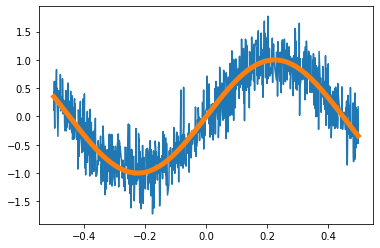

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.plot(x,y)
ax.plot(x,y0,lw=5)
plt.show()


## 3. Approximation model
Define an approximation model y_approx(x, wa, wb, wc, wd) with some weights wa,wb,wc,wd,..., which we will optimize. You can try any differenciable function. For example polynom:

```python
def y_approx(x, wa, wb, wc, wd):
    return wa + wb*x + wc*x**2 + wd*x**3
```

In [3]:
def y_approx(x, wa, wb, wc, wd):
    return wa + wb*x + wc*x**2 + wd*x**3

## 4. Gradient descent method

Train your model using gradient descent method. Choose learning_rate and epoch count to reach the loss = 0.098

In [4]:
# Initialize weights wa, wb, wc, wd
wa = np.random.rand()
wb = np.random.rand()
wc = np.random.rand()
wd = np.random.rand()
for epoch in range(10000):
    
    # Forward pass: compute predicted y y_pred for whole vector x using your approximation model
    y_pred = y_approx(x,wa,wb,wc,wd)
    
    # true y
    y_true = y
    
    # Compute loss
    loss = ((y_pred - y_true)**2).mean()
    
    # Print loss
    print(f'epoch = {epoch}, loss = {loss}')
    
    # Compute gradient of loss (derivatives of loss by weights)
    dloss_by_y_pred = 2*(y_pred - y_true)/n
    dy_pred_by_wa = 1
    dy_pred_by_wb = x
    dy_pred_by_wc = x**2
    dy_pred_by_wd = x**3
    dloss_by_wa = np.sum(dloss_by_y_pred*dy_pred_by_wa)
    dloss_by_wb = np.sum(dloss_by_y_pred*dy_pred_by_wb)
    dloss_by_wc = np.sum(dloss_by_y_pred*dy_pred_by_wc)
    dloss_by_wd = np.sum(dloss_by_y_pred*dy_pred_by_wd)
    
    # Slightly change weights to decrease loss in oposite to gradent direction
    learning_rate = 0.4
    wa -= learning_rate*dloss_by_wa
    wb -= learning_rate*dloss_by_wb
    wc -= learning_rate*dloss_by_wc
    wd -= learning_rate*dloss_by_wd

epoch = 0, loss = 0.989152292307032
epoch = 1, loss = 0.49246236762906187
epoch = 2, loss = 0.46228581014436715
epoch = 3, loss = 0.45121298812639
epoch = 4, loss = 0.4421387160831622
epoch = 5, loss = 0.4342494763000849
epoch = 6, loss = 0.42736944372202884
epoch = 7, loss = 0.42136587280476395
epoch = 8, loss = 0.41612413827065514
epoch = 9, loss = 0.41154463470296876
epoch = 10, loss = 0.40754078454741627
epoch = 11, loss = 0.4040373332107689
epoch = 12, loss = 0.40096886814079596
epoch = 13, loss = 0.3982785316274393
epoch = 14, loss = 0.39591690195270657
epoch = 15, loss = 0.3938410208702836
epoch = 16, loss = 0.3920135482769683
epoch = 17, loss = 0.39040202744104285
epoch = 18, loss = 0.38897824632830924
epoch = 19, loss = 0.38771768245758187
epoch = 20, loss = 0.3865990203611707
epoch = 21, loss = 0.38560373215465654
epoch = 22, loss = 0.3847157129621596
epoch = 23, loss = 0.3839209640227849
epoch = 24, loss = 0.3832073172422231
epoch = 25, loss = 0.3825641957690707
epoch = 26, 

In [5]:
print('Totally we use', epoch*n, 'objects while training')
print(wa,wb,wc,wd)


Totally we use 9999000 objects while training
-0.0029716331853168864 5.219674866027171 0.12652912850385586 -25.359580232922735


## 5. Result
Plot result model with initial data on the same graph. If you don't like your result, try to change model or initial weights and restart training

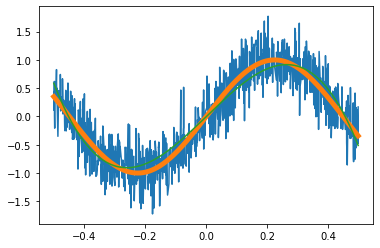

In [6]:
y_pred = y_approx(x, wa, wb, wc, wd)
fig, ax = plt.subplots()
ax.plot(x,y)
ax.plot(x,y0,lw=5)
ax.plot(x,y_pred)
plt.show()



## 6. Stochastic gradient descent
Copy missing code from task 4 and change it to process one object `x[ind]` with random index `ind` at a time. 

How many objects you need to process to reach the same loss?

In [10]:
# Initialize weights
wa = np.random.rand()
wb = np.random.rand()
wc = np.random.rand()
wd = np.random.rand()
# Initialize mean_loss with zero
mean_loss=0
# fix random seed to make result deterministic
np.random.seed(0)

# loop by objects
for cycle in range(100000):
    # use np.random.choice function to take random index ind inside interval [0,n-1]
    ind = np.random.choice(range(n))
    
    
    # Forward pass: compute predicted y_pred for chosen object x[ind]
    y_pred = y_approx(x[ind], wa, wb, wc, wd)
    
    # Compute loss for one object
    loss = (y_pred - y_true[ind])**2
    
    # Compute mean loss for several cycles using exponential moving average and alpha = 0.01
    # https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
    alpha = 0.01
    mean_loss = alpha*loss + (1 - alpha)*mean_loss
    
    # Print loss
    print(f'cycle = {cycle}, loss = {mean_loss}')
    
    # Compute gradient of loss - we shouldn't divide by n here
    dloss_by_y_pred = 2*(y_pred - y_true[ind])
    dy_pred_by_wa = 1
    dy_pred_by_wb = x[ind]
    dy_pred_by_wc = x[ind]**2
    dy_pred_by_wd = x[ind]**3
    dloss_by_wa = np.sum(dloss_by_y_pred*dy_pred_by_wa)
    dloss_by_wb = np.sum(dloss_by_y_pred*dy_pred_by_wb)
    dloss_by_wc = np.sum(dloss_by_y_pred*dy_pred_by_wc)
    dloss_by_wd = np.sum(dloss_by_y_pred*dy_pred_by_wd)
    
    # other code
    learning_rate = 0.1
    wa -= learning_rate*dloss_by_wa
    wb -= learning_rate*dloss_by_wb
    wc -= learning_rate*dloss_by_wc
    wd -= learning_rate*dloss_by_wd

cycle = 0, loss = 0.0005207477811876935
cycle = 1, loss = 0.000726402519188772
cycle = 2, loss = 0.0024671273509202707
cycle = 3, loss = 0.020672344501520508
cycle = 4, loss = 0.023180949790261127
cycle = 5, loss = 0.03033738337710858
cycle = 6, loss = 0.031607103222476535
cycle = 7, loss = 0.03844263209861971
cycle = 8, loss = 0.04338695608383063
cycle = 9, loss = 0.049750850008518414
cycle = 10, loss = 0.0698862040870776
cycle = 11, loss = 0.07107974861031649
cycle = 12, loss = 0.0724935385382091
cycle = 13, loss = 0.07474676270176012
cycle = 14, loss = 0.0756374061116018
cycle = 15, loss = 0.08236653630475571
cycle = 16, loss = 0.08196501008588798
cycle = 17, loss = 0.08639334653427824
cycle = 18, loss = 0.08755979033099369
cycle = 19, loss = 0.09383073826165556
cycle = 20, loss = 0.09300649183525195
cycle = 21, loss = 0.09208258794584671
cycle = 22, loss = 0.09121121642895591
cycle = 23, loss = 0.09322959933140826
cycle = 24, loss = 0.09346863355135798
cycle = 25, loss = 0.09577916

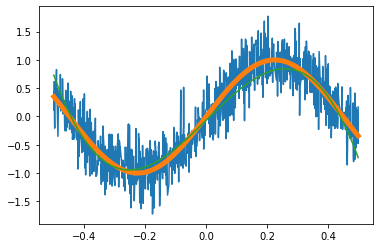

In [16]:
y_pred = y_approx(x, wa, wb, wc, wd)
fig, ax = plt.subplots()
ax.plot(x,y)
ax.plot(x,y0,lw=5)
ax.plot(x,y_pred)
plt.show()

In [17]:
print('Totally we use', cycle, 'objects while training')
print(wa, wb, wc, wd)
print('mean_loss:', mean_loss)


Totally we use 99999 objects while training
-0.06682396108151978 5.258918813453668 0.24062419103230187 -26.95269750000375
mean_loss: 0.0946461530360816


## 7. Batches
Mordern computational accelerators require grouping of objects in batches. Copy code from task 6 and change it to process a batch of 32 random objects at a time.

Calculate, how many objects you need to process to reach the same loss?

In [22]:
# Initialize weights
wa = np.random.rand()
wb = np.random.rand()
wc = np.random.rand()
wd = np.random.rand()
# Initialize mean_loss with zero
mean_loss = 0
mean_loss_group = 0
# fix random seed to make result deterministic
np.random.seed(0)
ind = [0]*32
loss = [0]*32
y_pred = [0]*32
y_true = [0]*32

# loop by objects
for cycle in range(100000):
    # use np.random.choice function to take random index ind inside interval [0,n-1]
    ind = np.random.choice(range(n), 32)

    # Forward pass: compute predicted y_pred for chosen object x[ind]
    y_pred = y_approx(x[ind], wa, wb, wc, wd)
    y_true = y
    # Compute loss for one object
    loss = ((y_pred - y_true[ind])**2).mean()

    # Compute mean loss for several cycles using exponential moving average and alpha = 0.01
    # https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
    alpha = 0.01
    mean_loss = alpha*loss + (1 - alpha)*mean_loss

    # Print loss
    print(f'cycle = {cycle}, loss = {mean_loss}')

    # Compute gradient of loss - we shouldn't divide by n here
    dloss_by_y_pred = 2*(y_pred - y_true[ind])/32
    dy_pred_by_wa = 1
    dy_pred_by_wb = x[ind]
    dy_pred_by_wc = x[ind]**2
    dy_pred_by_wd = x[ind]**3
    dloss_by_wa = np.sum(dloss_by_y_pred*dy_pred_by_wa).sum()
    dloss_by_wb = np.sum(dloss_by_y_pred*dy_pred_by_wb).sum()
    dloss_by_wc = np.sum(dloss_by_y_pred*dy_pred_by_wc).sum()
    dloss_by_wd = np.sum(dloss_by_y_pred*dy_pred_by_wd).sum()
    
    # other code
    learning_rate = 0.1
    wa -= learning_rate*dloss_by_wa
    wb -= learning_rate*dloss_by_wb
    wc -= learning_rate*dloss_by_wc
    wd -= learning_rate*dloss_by_wd

cycle = 0, loss = 0.0047283365429672194
cycle = 1, loss = 0.010111052629852992
cycle = 2, loss = 0.014269190046525226
cycle = 3, loss = 0.01699116776990288
cycle = 4, loss = 0.0216320093798731
cycle = 5, loss = 0.02440097368749561
cycle = 6, loss = 0.028677058235087025
cycle = 7, loss = 0.031018135400463782
cycle = 8, loss = 0.03593450575900556
cycle = 9, loss = 0.040074328022842824
cycle = 10, loss = 0.04417555908585016
cycle = 11, loss = 0.047622611211537796
cycle = 12, loss = 0.051359319072767584
cycle = 13, loss = 0.05445790193366024
cycle = 14, loss = 0.057629615279725314
cycle = 15, loss = 0.061230801997232444
cycle = 16, loss = 0.06504758982801971
cycle = 17, loss = 0.06835277479374664
cycle = 18, loss = 0.07131493254743693
cycle = 19, loss = 0.07583460747710093
cycle = 20, loss = 0.07775629710305541
cycle = 21, loss = 0.08118363575017477
cycle = 22, loss = 0.08364057510420222
cycle = 23, loss = 0.08680843496163526
cycle = 24, loss = 0.09168221437729004
cycle = 25, loss = 0.0946

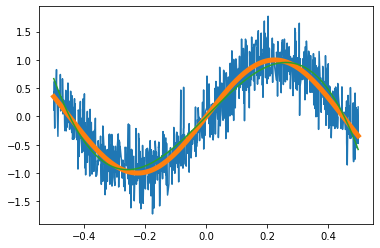

In [23]:
y_pred = y_approx(x, wa, wb, wc, wd)
fig, ax = plt.subplots()
ax.plot(x,y)
ax.plot(x,y0,lw=5)
ax.plot(x,y_pred)
plt.show()

In [24]:
print('Totally we use', cycle, 'objects while training')
print(wa, wb, wc, wd)
print('mean_loss:', mean_loss)


Totally we use 99999 objects while training
-0.0023561174079282424 5.46831177295981 0.14238930734278243 -26.968323068443954
mean_loss: 0.09672301110872804


## 8. PyTorch

If you have not installed PyTorch library for neural net training, do it now by command:

```bash
pip install torch
```
Implement your model using PyTorch library, which can automatically evaluate gradients and apply gradient descent method

In [29]:
import torch

class ApproxModel(torch.nn.Module):
    
    def __init__(self):
        super().__init__()
        # initialize model parameters, using special class Parameter
        self.w = torch.nn.Parameter(torch.Tensor([0, 0, 0, 0]))
        
    def forward(self, x):
        # forward step function should return model value y_approx for weights w[0], w[1], w[2], w[3]
        return self.w[0]+ self.w[1]*x+ self.w[2]*x**2 + self.w[3]*x**3
    
model = ApproxModel()

# class to apply gradient descent method and change model parameters
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

mean_loss = 0

for cycle in range(100000):
    
    ind = np.random.choice(n, size=32)
    x1 = torch.tensor(x[ind])
    y_true = torch.tensor(y[ind])
    
    # Forward pass: compute predicted y for all x
    y_pred = model(x1)
    
    # Compute loss
    loss = ((y_pred - y_true)**2).mean()
    
    # Print average loss
    lamb = 0.01
    mean_loss = lamb*loss + (1-lamb)*mean_loss
    print(f'cycle = {cycle}, loss = {mean_loss}')
    
    # initialize gradients
    optimizer.zero_grad()
    
    # calculate gradients 
    loss.backward()
    
    # change weights to decrease loss in oposite to gradent direction
    optimizer.step()

cycle = 0, loss = 0.005567539309684442
cycle = 1, loss = 0.01051806385179923
cycle = 2, loss = 0.016430137400376396
cycle = 3, loss = 0.02270650161255964
cycle = 4, loss = 0.02842085956671338
cycle = 5, loss = 0.0329011376040459
cycle = 6, loss = 0.037884249335700025
cycle = 7, loss = 0.04218262135839478
cycle = 8, loss = 0.04757153629401829
cycle = 9, loss = 0.05188324832343876
cycle = 10, loss = 0.05531148294808251
cycle = 11, loss = 0.059873559133257745
cycle = 12, loss = 0.06487240548195751
cycle = 13, loss = 0.06977692437576623
cycle = 14, loss = 0.07489556708677712
cycle = 15, loss = 0.07739202201838807
cycle = 16, loss = 0.08056497085647267
cycle = 17, loss = 0.08543981635865733
cycle = 18, loss = 0.08932709106071873
cycle = 19, loss = 0.09302339635422367
cycle = 20, loss = 0.09586638492821764
cycle = 21, loss = 0.09896194460054479
cycle = 22, loss = 0.10162602707032611
cycle = 23, loss = 0.10431103981724078
cycle = 24, loss = 0.10723317445949761
cycle = 25, loss = 0.11256554478

In [30]:
# print result weights
print('Result:', model.w)

Result: Parameter containing:
tensor([ -0.0297,   5.3825,   0.0406, -26.5772], requires_grad=True)


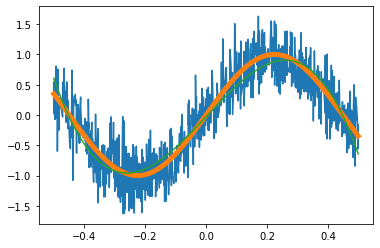

In [31]:
w = model.w.detach().numpy()
y_pred = y_approx(x, w[0], w[1], w[2], w[3])
fig, ax = plt.subplots()
ax.plot(x,y)
ax.plot(x,y0,lw=5)
ax.plot(x,y_pred)
plt.show()

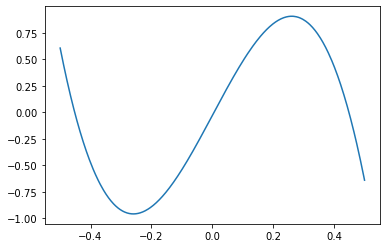

In [32]:
# To use weights outside neural net (with automatic gradient calculation) we need to "detach" it
w = model.w.detach().numpy()
# Plot result model with initial data on the same graph
Plot_result_model = w[0]+ w[1]*x+ w[2]*x**2 + w[3]*x**3
plt.plot(x, Plot_result_model)

## 9

Make your model more complex to reach better quality. Enjoy automatic gradient evaluation by PyTorch library

In [ ]:
# place for code


